# 1. Load and Crop Images

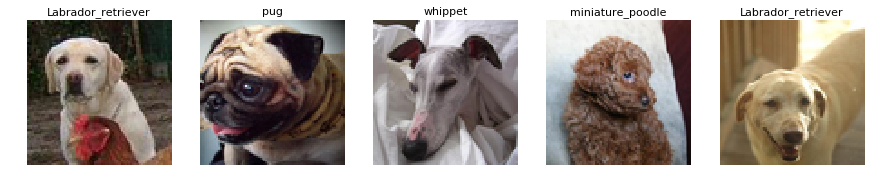

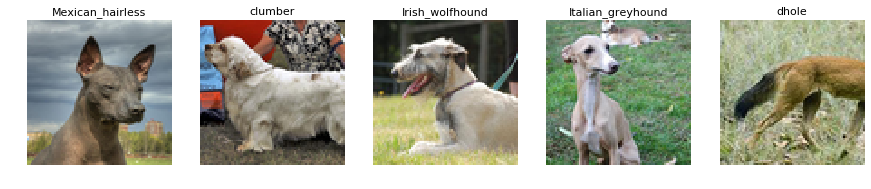

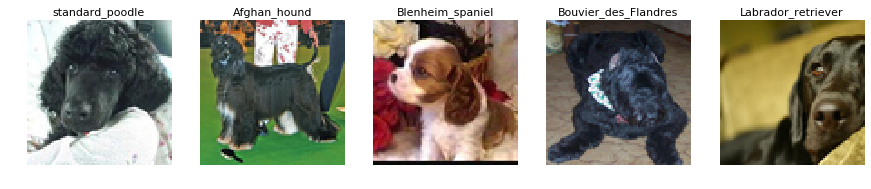

In [2]:
import numpy as np
import os
import gc
import xml.etree.ElementTree as ET
import time
import matplotlib.pyplot as plt
from PIL import Image 

# STOP KERNEL IF IT RUNS FOR MORE THAN 8 HOURS
kernel_start = time.time()
LIMIT = 8

# PREPROCESS IMAGES
ROOT = '/input/'
IMAGES = os.listdir(ROOT + 'all-dogs/all-dogs/')
breeds = os.listdir(ROOT + 'annotation/Annotation/') 

idxIn = 0; namesIn = []
imagesIn = np.zeros((25000,80,80,3))

# CROP WITH BOUNDING BOXES TO GET DOGS ONLY
for breed in breeds:
    for dog in os.listdir(ROOT+'annotation/Annotation/'+breed):
        try: img = Image.open(ROOT+'all-dogs/all-dogs/'+dog+'.jpg') 
        except: continue           
        ww,hh = img.size
        tree = ET.parse(ROOT+'annotation/Annotation/'+breed+'/'+dog)
        root = tree.getroot()
        objects = root.findall('object')
        for o in objects:
            bndbox = o.find('bndbox') 
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            w = np.min((xmax - xmin, ymax - ymin))
            # ADD PADDING TO CROPS
            EXTRA = w//8
            a1 = EXTRA; a2 = EXTRA; b1 = EXTRA; b2 = EXTRA
            a1 = np.min((a1,xmin)); a2 = np.min((a2,ww-xmin-w))
            b1 = np.min((b1,ymin)); b2 = np.min((b2,hh-ymin-w))
            img2 = img.crop((xmin-a1, ymin-b1, xmin+w+a2, ymin+w+b2))
            img2 = img2.resize((80,80), Image.ANTIALIAS)
            imagesIn[idxIn,:,:,:] = np.asarray(img2)
            namesIn.append(breed)                
            #if idxIn%1000==0: print(idxIn)
            idxIn += 1

idx = np.arange(idxIn)
np.random.shuffle(idx)
imagesIn = imagesIn[idx,:,:,:]
namesIn = np.array(namesIn)[idx]
    
    
# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,25)
for k in range(3):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        plt.title(namesIn[x[k*5+j]].split('-')[1],fontsize=11)
        plt.imshow(img)
    plt.show()

In [3]:
import tensorflow as tf
tf.enable_eager_execution()

# FUNCTION FOR DATA AUGMENTATION
def flip(x: tf.Tensor, y:tf.Tensor) -> (tf.Tensor,tf.Tensor):
    x = tf.image.random_flip_left_right(x)
    return (x,y)

# FUNCTION FOR DATA AUGMENTATION
def crop(x: tf.Tensor, y:tf.Tensor) -> (tf.Tensor,tf.Tensor):
    x = tf.random_crop(x,size=[64,64,3])
    return (x,y)

/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

In [4]:
BATCH_SIZE = 32

from sklearn import preprocessing

for i in range(len(namesIn)):
    namesIn[i] = namesIn[i].split('-')[1].lower()
le = preprocessing.LabelEncoder()
namesIn = le.fit_transform(namesIn)

imagesIn = (imagesIn[:idxIn,:,:,:]-127.5)/127.5
namesIn = namesIn[:idxIn]
imagesIn = imagesIn.astype('float32')
namesIn = namesIn.astype('int8')
ds = tf.data.Dataset.from_tensor_slices((imagesIn,namesIn)).map(flip).map(crop).batch(BATCH_SIZE,drop_remainder=True)
print('TF Version',tf.__version__); print()
print('Our TF data pipeline has been built')
print(ds)

TF Version 1.14.0

Our TF data pipeline has been built
<DatasetV1Adapter shapes: ((32, 64, 64, 3), (32,)), types: (tf.float32, tf.int8)>


# 2. Generator
The Generator receives both a random seed `Z` and class label(s) `C`. It then attempts to draw a dog matching the label(s). We use an `Embedding 120x120` to input the categorical variable breed into our net. We then concatenate it with our length 128 seed and then fully connect both to our first group of 1024x4x4 maps.

In [5]:
MAPS = 128
noise_dim = 128

from tensorflow.keras import layers
from tensorflow.keras.initializers import RandomNormal
init = RandomNormal(mean=0.0, stddev=0.02)

def make_generator():
    seed = tf.keras.Input(shape=((noise_dim,)))
    label = tf.keras.Input(shape=((1,)))
    x = layers.Embedding(120, 120, input_length=1,name='emb')(label)
    x = layers.Flatten()(x)
    x = layers.concatenate([seed,x])
    x = layers.Dense(4*4*MAPS*8, use_bias=False)(x)
    x = layers.Reshape((4, 4, MAPS*8))(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    x = layers.Conv2DTranspose(MAPS*4, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    x = layers.Conv2DTranspose(MAPS*2, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    x = layers.Conv2DTranspose(MAPS, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    x = layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False, activation='tanh')(x)

    model = tf.keras.Model(inputs=[seed,label], outputs=x)    
    return model

generator = make_generator()
#generator.summary()

# 3. Discriminator
The Discriminator receives both an image and class label(s). We can design it however we want. Two examples are pictured below. In this kernel, we build option 1. Likewise, we could have designed the Generator in different ways. Option 1 knows the class while it extracts image features. Option 2 extracts features first and then receives the class information for classfication. (Kernel version 13 uses option 2).
![image](http://playagricola.com/Kaggle/disc3b.jpg)

In [6]:
GNOISE = 0.25

def make_discriminator():
    image = tf.keras.Input(shape=((64,64,3)))
    label = tf.keras.Input(shape=((1,)))
    x = layers.Embedding(120, 64*64, input_length=1)(label)
    x = layers.Reshape((64,64,1))(x)
    x = layers.concatenate([image,x])
    
    x = layers.Conv2D(MAPS, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    #x = layers.GaussianNoise(GNOISE)(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(MAPS*2, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    #x = layers.GaussianNoise(GNOISE)(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(MAPS*4, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    #x = layers.GaussianNoise(GNOISE)(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(MAPS*8, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    #x = layers.GaussianNoise(GNOISE)(x)
    x = layers.LeakyReLU()(x)
    
    x = layers.Flatten()(x)
    x = layers.Dense(121, activation='sigmoid')(x)
    x2 = layers.Dense(1, activation='linear')(x)
    
    model = tf.keras.Model(inputs=[image,label], outputs=[x,x2])
    return model

discriminator = make_discriminator()
#discriminator.summary()

# 4. Losses and Optimizers
To balance the Generator's and Discriminator's CGAN learning, we found that making the Generator's learning rate larger than the Discriminator's helps. (For basic RaLSGAN, we found that setting them equal was fine). With the additional class information the job of the Discriminator is easier. If the Discriminator knows that it should be receiving an image of a Black Lab and the image is white than it is clearly fake.

In [7]:
# THESE LOSS FUNCTIONS ARE UNUSED. THEY ARE REWRITTEN INSIDE TRAINING LOOP BELOW
from tensorflow.contrib.eager.python import tfe

# RaLS Discriminator Loss
def RaLS_errD(fake,real):
    return (tf.reduce_mean( (real - tf.reduce_mean(fake,0) - tf.ones_like(real))**2,0 )
        + tf.reduce_mean( (fake - tf.reduce_mean(real,0) + tf.ones_like(real))**2,0 ) )/2.

# RaLS Generator Loss
def RaLS_errG(fake,real):
    return (tf.reduce_mean( (real - tf.reduce_mean(fake,0) + tf.ones_like(real))**2,0 )
        + tf.reduce_mean( (fake - tf.reduce_mean(real,0) - tf.ones_like(real))**2,0 ) )/2.

# OPTIMIZER - ADAM
learning_rate = tfe.Variable(0.0002)
generator_optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.5)
discriminator_optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.5)

# 5. Training Loop

In [8]:
DISPLAY_EVERY = 10

def display_images(model, test_input, labs):
    predictions = model([test_input,labs], training=False)
    fig = plt.figure(figsize=(16,4))
    for i in range(predictions.shape[0]):
        plt.subplot(2, 8, i+1)
        plt.imshow( (predictions[i, :, :, :]+1.)/2. )
        plt.axis('off')
    plt.show()
    
def generate_latent_points(latent_dim, n_samples):
    return tf.random.truncated_normal((n_samples,latent_dim))

def train(dataset, epochs):
    all_gl = np.array([]); all_dl = np.array([])
    
    for epoch in range(epochs):
        start = time.time()
        gl = []; dl = []

        idx = np.arange(idxIn)
        np.random.shuffle(idx)
        dataset = (tf.data.Dataset.from_tensor_slices((imagesIn[idx,:,:,:],namesIn[idx]))
            .map(flip).map(crop).batch(BATCH_SIZE,drop_remainder=True))
        
        # TRAIN ACGAN
        for i,image_batch in enumerate(dataset):
            gg,dd = train_step(image_batch,generator,discriminator,
                        generator_optimizer, discriminator_optimizer)
            gl.append(gg); dl.append(dd)
        all_gl = np.append(all_gl,np.array([gl]))
        all_dl = np.append(all_dl,np.array([dl]))
        
        # EXPONENTIALLY DECAY LEARNING RATES
        if epoch>180: learning_rate.assign(learning_rate*0.95)
        
        # DISPLAY PROGRESS
        if epoch%DISPLAY_EVERY==0:
            # PLOT EPOCH LOSS
            plt.figure(figsize=(16,2))
            plt.plot(np.arange(len(gl)),gl,label='Gen_loss')
            plt.plot(np.arange(len(dl)),dl,label='Disc_loss')
            plt.legend()
            plt.title('Epoch '+str(epoch)+' Loss')
            ymax = plt.ylim()[1]
            plt.show()
            
            # PLOT ALL TIME LOSS
            plt.figure(figsize=(16,2))
            plt.plot(np.arange(len(all_gl)),all_gl,label='Gen_loss')
            plt.plot(np.arange(len(all_dl)),all_dl,label='Disc_loss')
            plt.legend()
            plt.ylim((0,np.min([1.1*np.max(all_gl),2*ymax])))
            plt.title('All Time Loss')
            plt.show()

            # DISPLAY IMAGES FROM TRAIN PROGRESS
            seed = generate_latent_points(noise_dim, num_examples)
            labs = tf.cast(120*tf.random.uniform((num_examples,1)),tf.int8)
            display_images(generator, seed, labs)
            
            # PRINT STATS
            print('EPOCH',epoch,'took',np.round(time.time()-start,1),'sec')
            print('Gen_loss mean=',np.mean(gl),'std=',np.std(gl))
            print('Disc_loss mean=',np.mean(dl),'std=',np.std(dl))
            print('Learning rate = ',end='')
            tf.print(discriminator_optimizer._lr)
            
        x = gc.collect()
        tt = np.round( (time.time() - kernel_start)/60,1 )
        if tt > LIMIT*60: break

Training started. Displaying every 10th epoch.


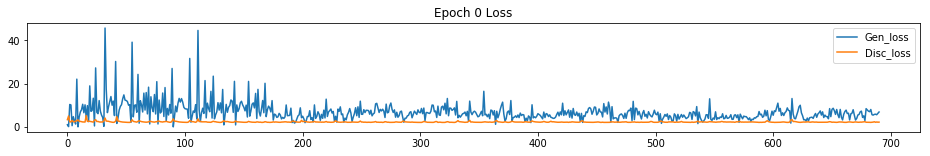

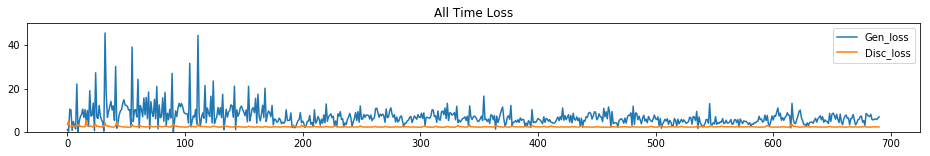

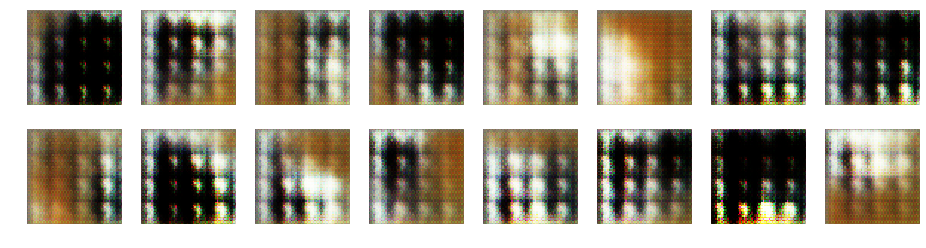

EPOCH 0 took 97.4 sec
Gen_loss mean= 6.9317026 std= 4.467993
Disc_loss mean= 2.3537736 std= 0.28343546
Learning rate = 0.0002


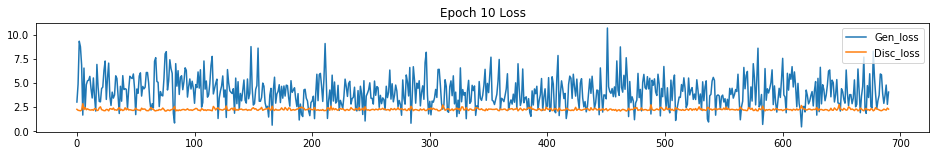

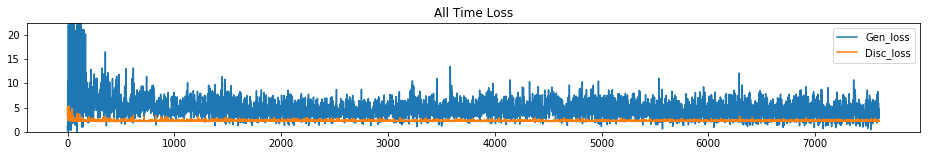

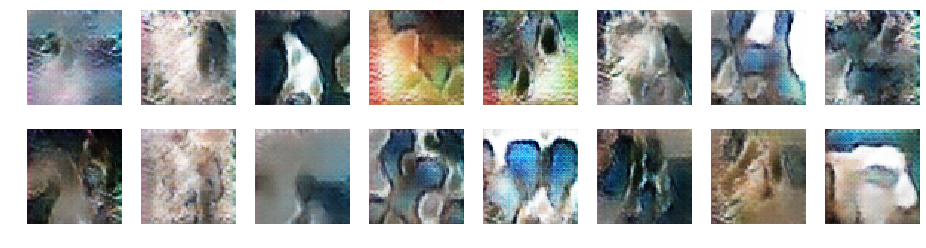

EPOCH 10 took 89.1 sec
Gen_loss mean= 4.088457 std= 1.5435331
Disc_loss mean= 2.2825992 std= 0.10547686
Learning rate = 0.0002


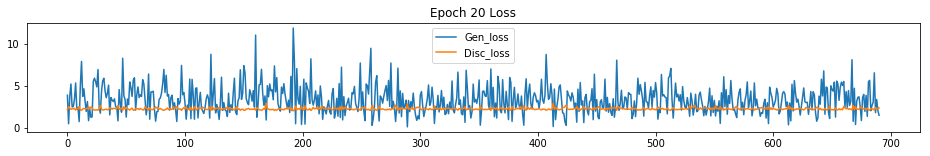

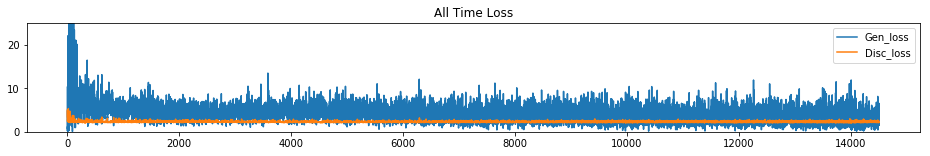

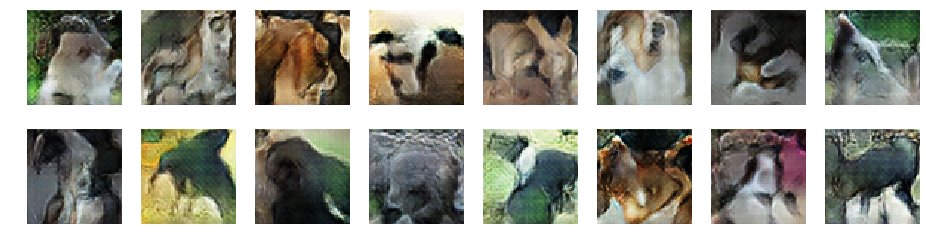

EPOCH 20 took 89.0 sec
Gen_loss mean= 3.387984 std= 1.6916499
Disc_loss mean= 2.3053164 std= 0.13048166
Learning rate = 0.0002


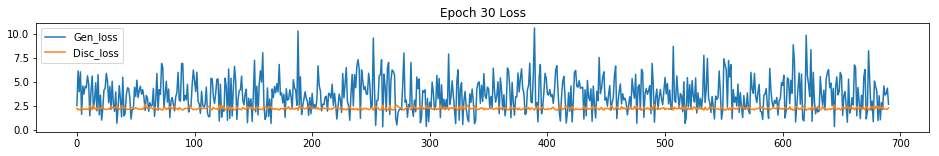

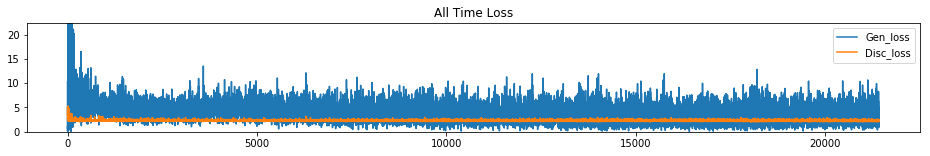

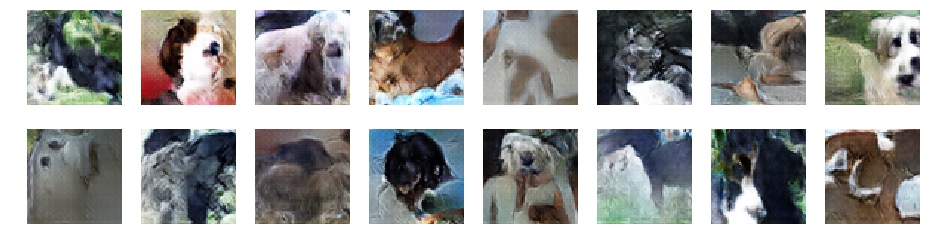

EPOCH 30 took 89.1 sec
Gen_loss mean= 3.6834302 std= 1.7479224
Disc_loss mean= 2.2853017 std= 0.12293874
Learning rate = 0.0002


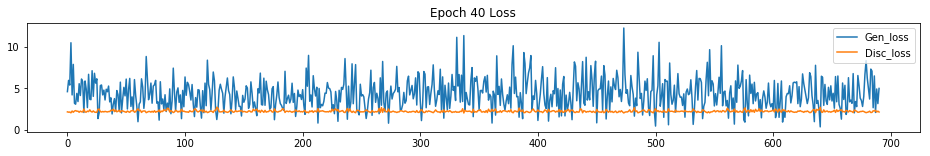

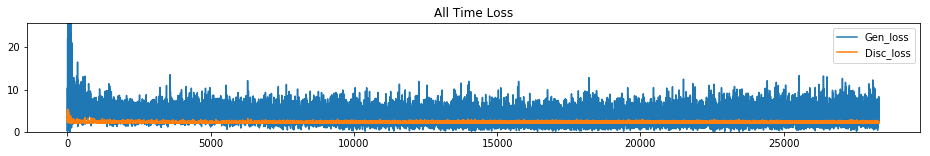

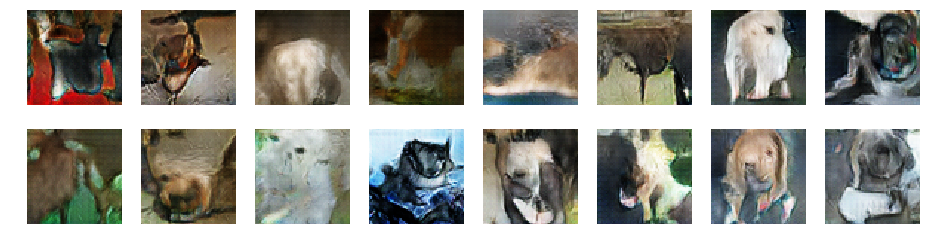

EPOCH 40 took 88.6 sec
Gen_loss mean= 4.36501 std= 1.8655456
Disc_loss mean= 2.2581954 std= 0.12302753
Learning rate = 0.0002


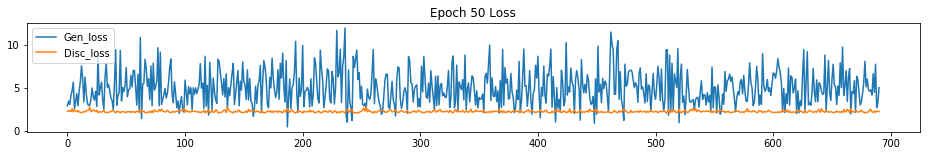

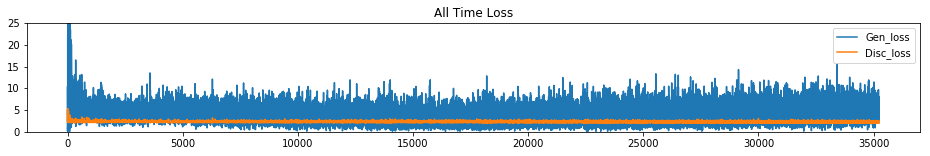

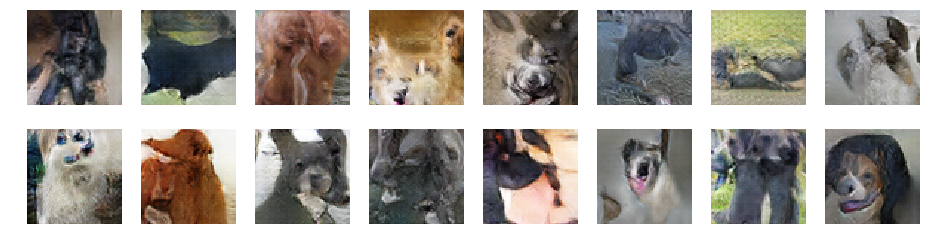

EPOCH 50 took 89.0 sec
Gen_loss mean= 4.9872684 std= 2.0027688
Disc_loss mean= 2.2360077 std= 0.114326164
Learning rate = 0.0002


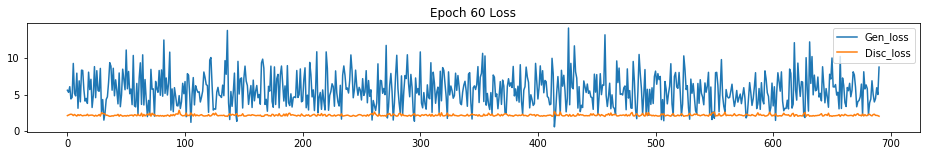

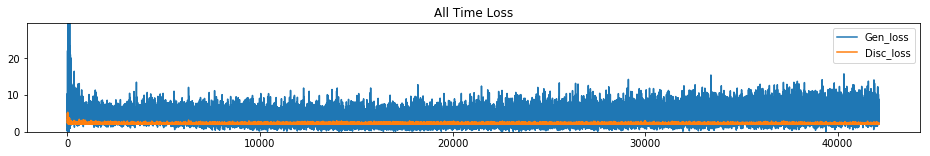

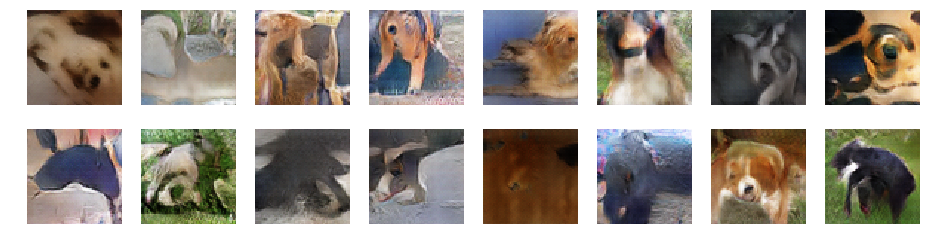

EPOCH 60 took 89.3 sec
Gen_loss mean= 5.6198983 std= 2.2399685
Disc_loss mean= 2.217246 std= 0.12066227
Learning rate = 0.0002


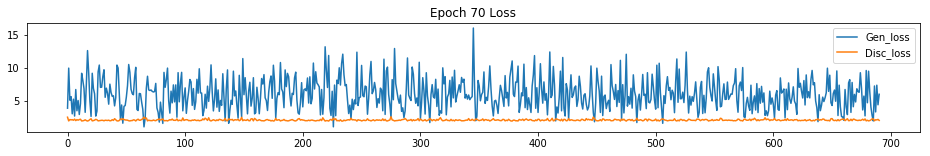

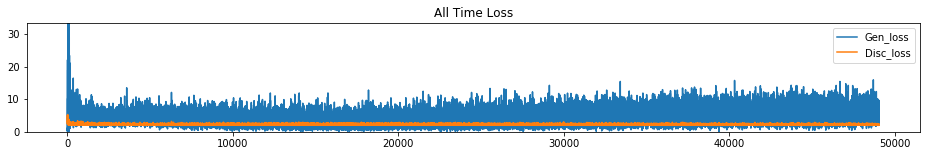

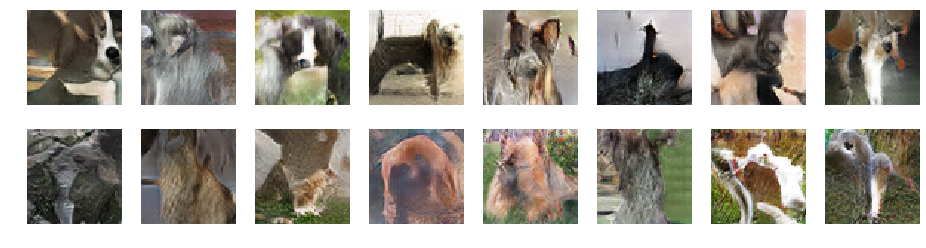

EPOCH 70 took 88.7 sec
Gen_loss mean= 6.1176014 std= 2.3387897
Disc_loss mean= 2.19935 std= 0.10758042
Learning rate = 0.0002


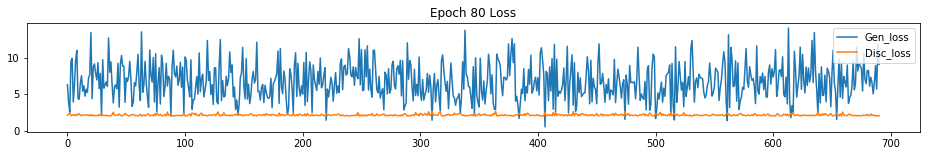

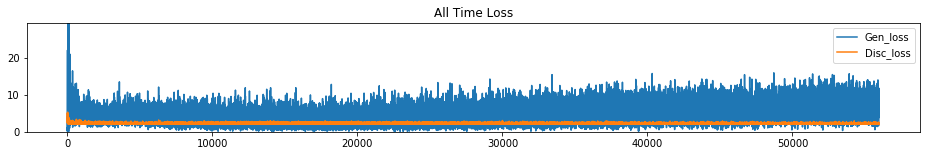

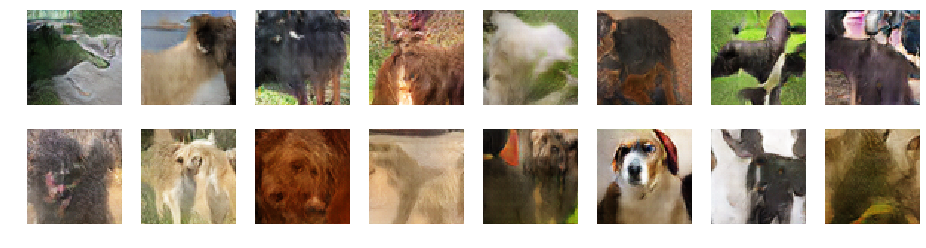

EPOCH 80 took 88.7 sec
Gen_loss mean= 6.7468133 std= 2.4716396
Disc_loss mean= 2.18665 std= 0.11875041
Learning rate = 0.0002


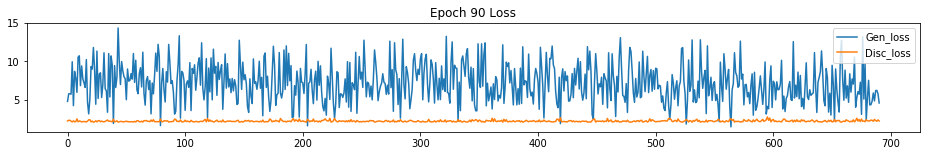

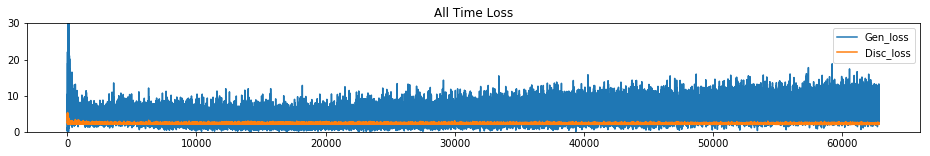

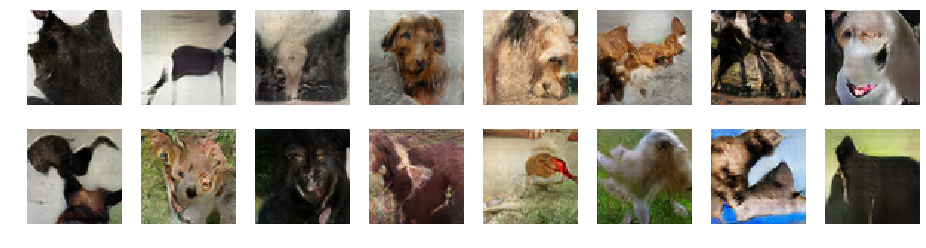

EPOCH 90 took 89.1 sec
Gen_loss mean= 7.1794467 std= 2.5084321
Disc_loss mean= 2.174557 std= 0.11073539
Learning rate = 0.0002


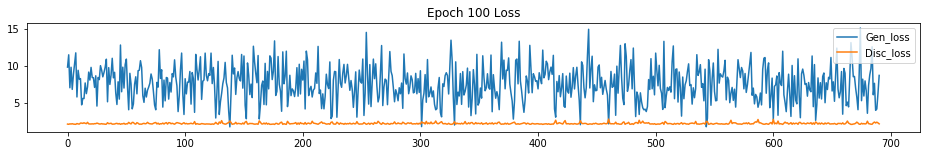

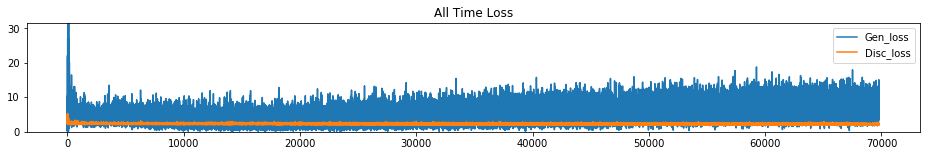

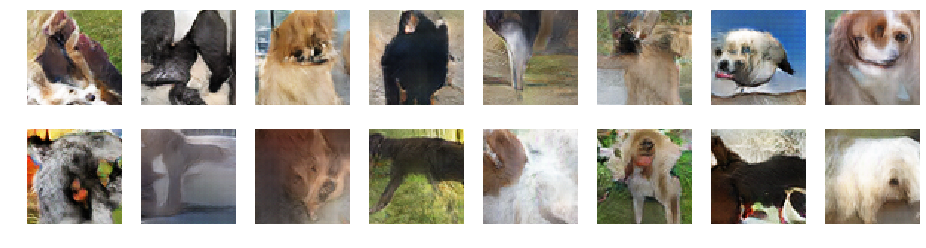

EPOCH 100 took 89.2 sec
Gen_loss mean= 7.5650363 std= 2.4036088
Disc_loss mean= 2.1598616 std= 0.1075331
Learning rate = 0.0002


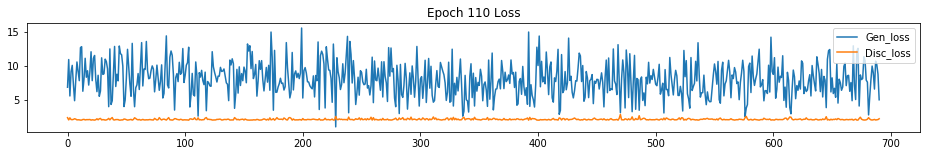

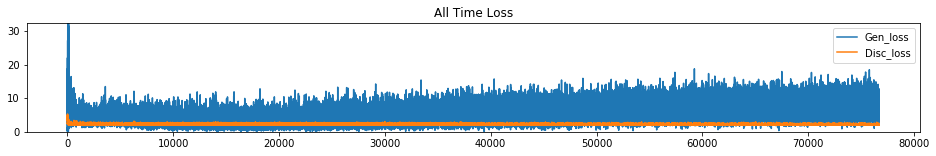

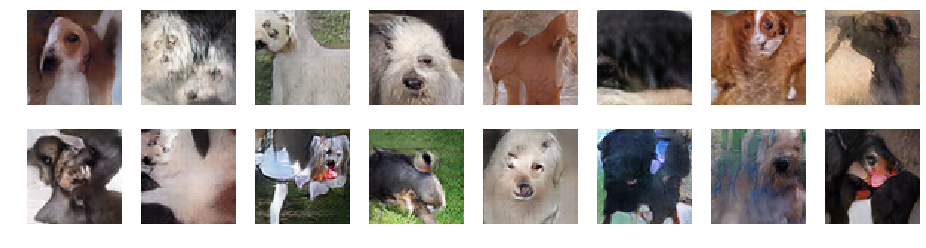

EPOCH 110 took 88.7 sec
Gen_loss mean= 8.034267 std= 2.475755
Disc_loss mean= 2.148625 std= 0.10538185
Learning rate = 0.0002


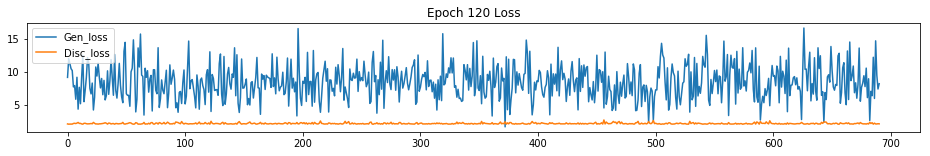

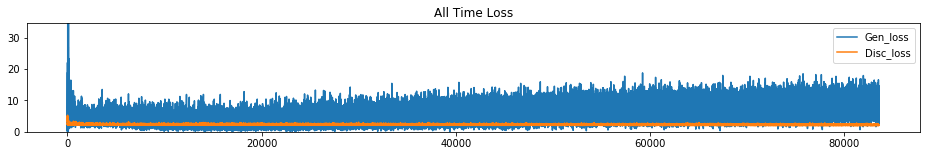

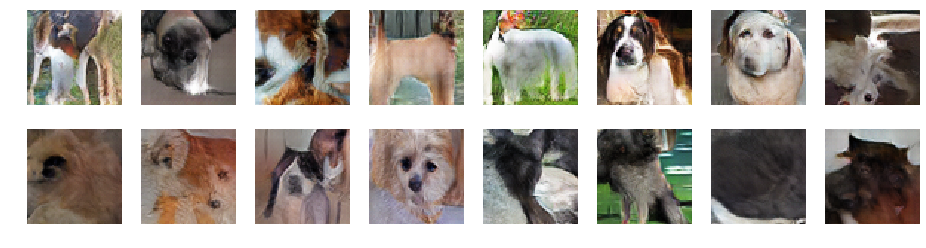

EPOCH 120 took 88.9 sec
Gen_loss mean= 8.441174 std= 2.6099286
Disc_loss mean= 2.135497 std= 0.09534061
Learning rate = 0.0002


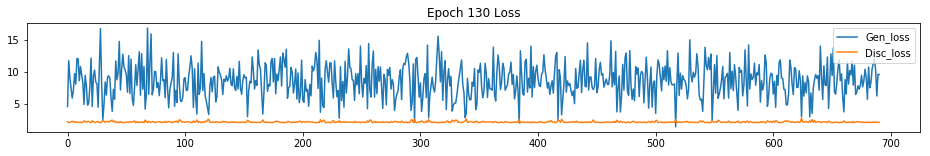

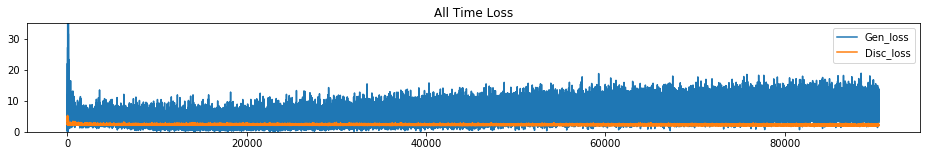

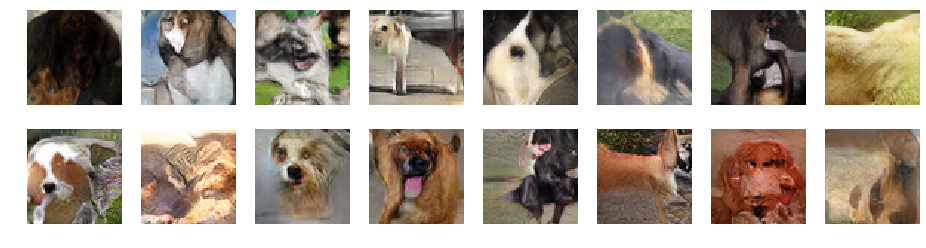

EPOCH 130 took 88.8 sec
Gen_loss mean= 8.559787 std= 2.619638
Disc_loss mean= 2.1344123 std= 0.10285378
Learning rate = 0.0002


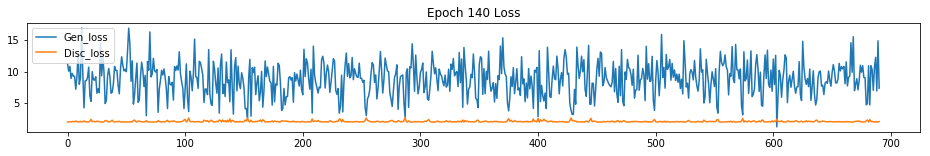

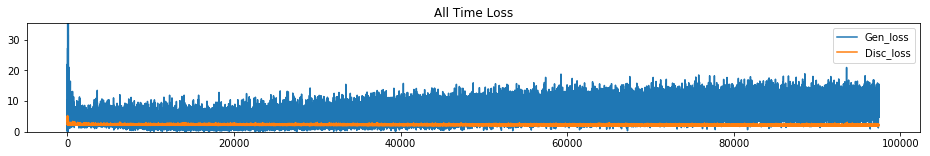

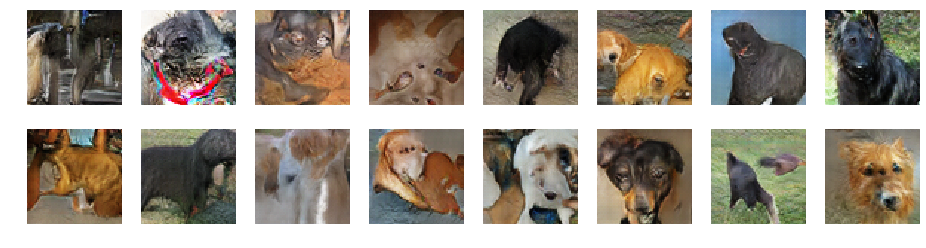

EPOCH 140 took 89.1 sec
Gen_loss mean= 8.887171 std= 2.6158197
Disc_loss mean= 2.1267147 std= 0.11059055
Learning rate = 0.0002


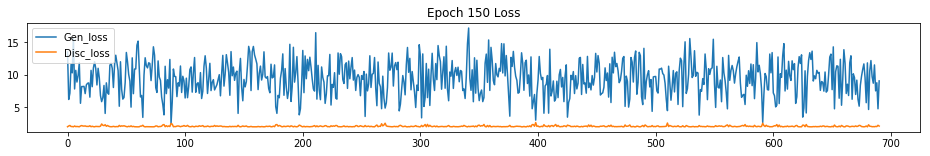

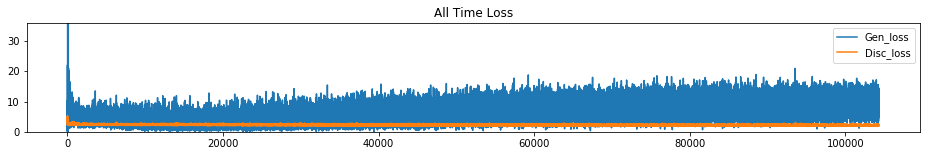

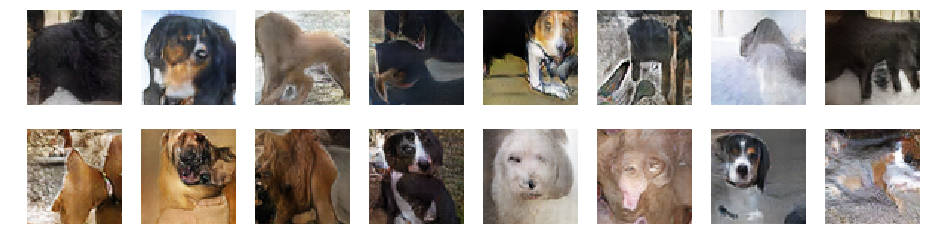

EPOCH 150 took 89.1 sec
Gen_loss mean= 9.496128 std= 2.6418898
Disc_loss mean= 2.1083236 std= 0.091766894
Learning rate = 0.0002


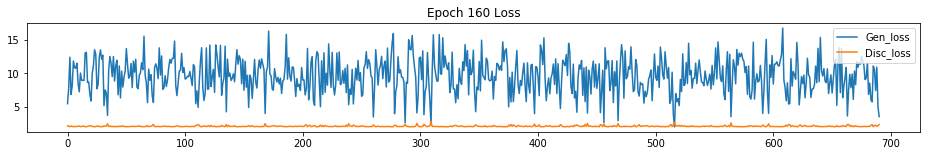

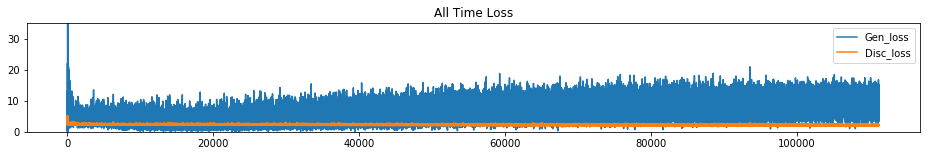

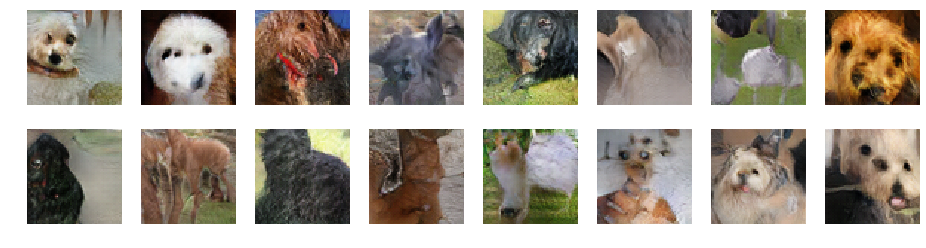

EPOCH 160 took 89.6 sec
Gen_loss mean= 9.670129 std= 2.612514
Disc_loss mean= 2.1028597 std= 0.09572729
Learning rate = 0.0002


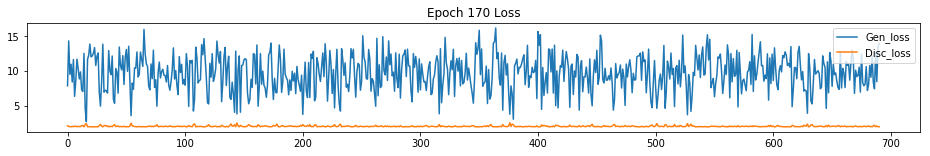

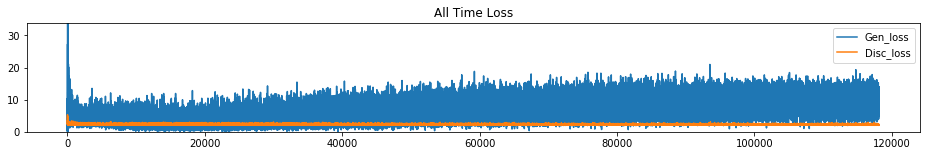

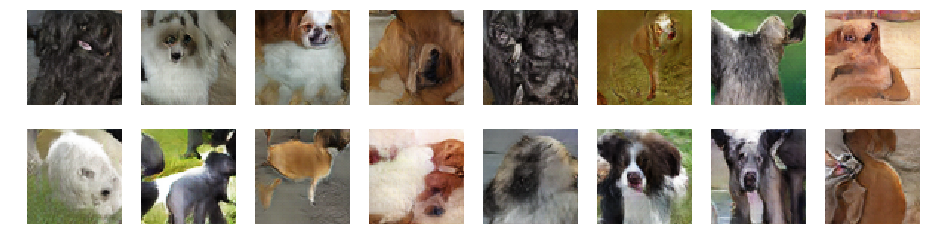

EPOCH 170 took 89.6 sec
Gen_loss mean= 9.744968 std= 2.5764153
Disc_loss mean= 2.0998178 std= 0.0905357
Learning rate = 0.0002


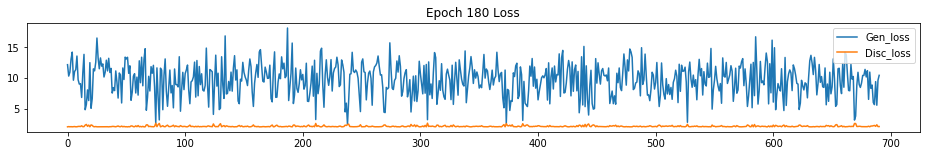

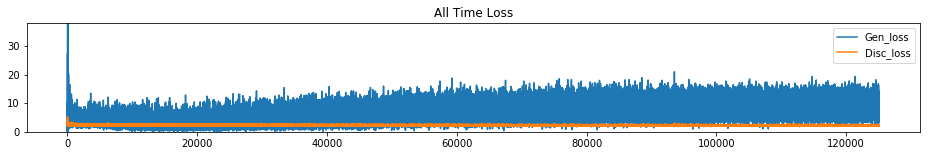

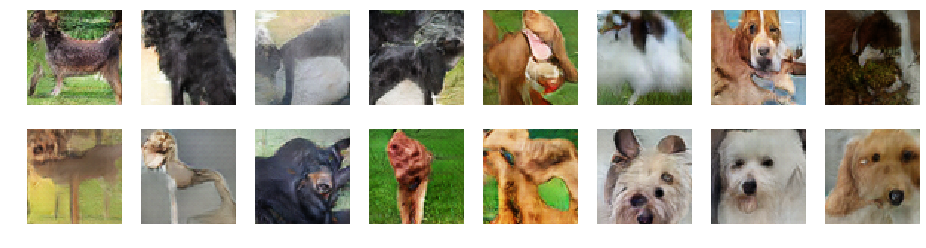

EPOCH 180 took 89.5 sec
Gen_loss mean= 9.681344 std= 2.6634405
Disc_loss mean= 2.1107497 std= 0.10491782
Learning rate = 0.0002


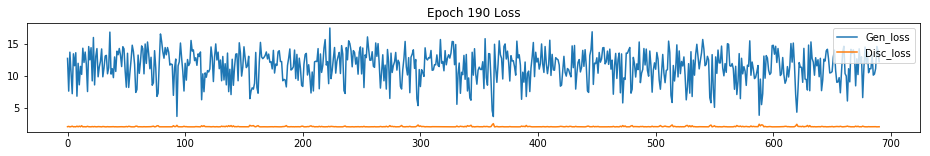

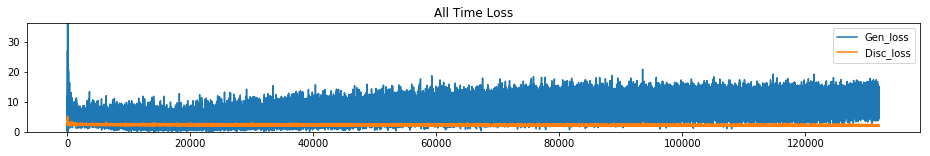

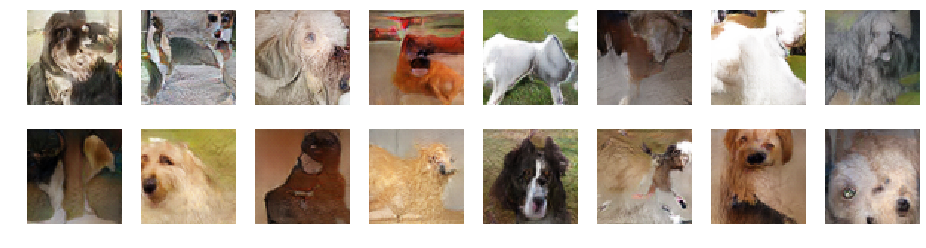

EPOCH 190 took 89.3 sec
Gen_loss mean= 11.5207815 std= 2.4090998
Disc_loss mean= 2.054608 std= 0.058926
Learning rate = 0.000119747376


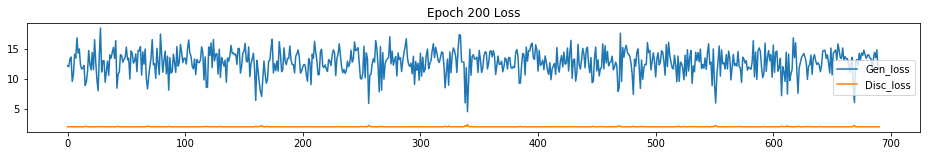

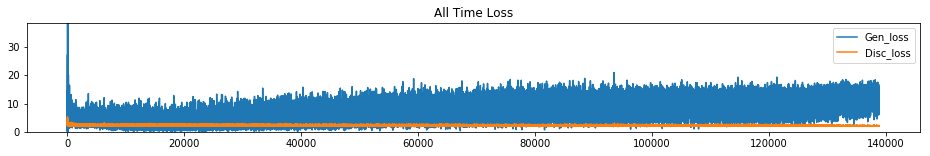

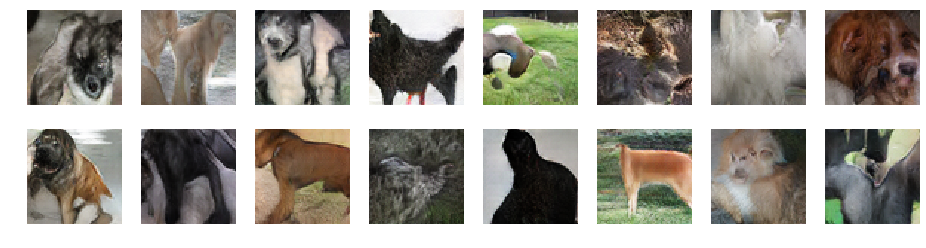

EPOCH 200 took 89.0 sec
Gen_loss mean= 12.753845 std= 1.9949787
Disc_loss mean= 2.029926 std= 0.033133887
Learning rate = 7.16971699e-05


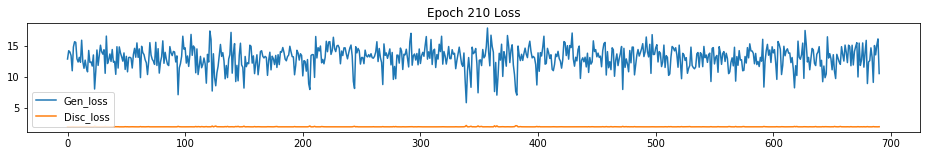

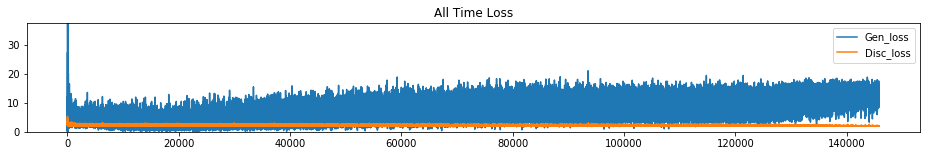

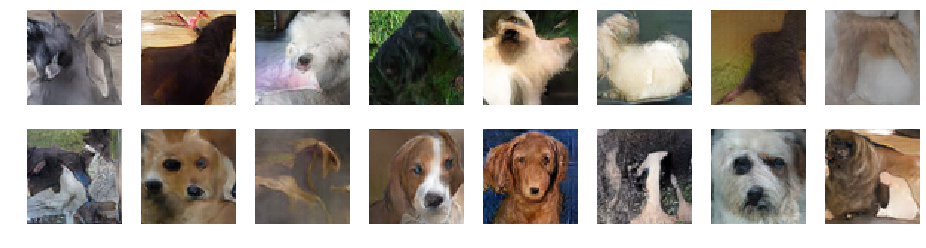

EPOCH 210 took 89.5 sec
Gen_loss mean= 13.086407 std= 1.8028809
Disc_loss mean= 2.0242445 std= 0.022688257
Learning rate = 4.29277388e-05


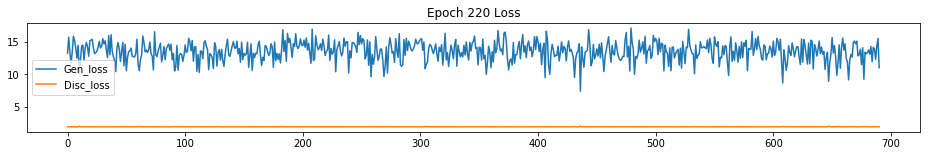

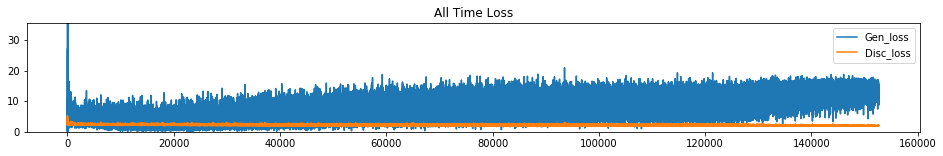

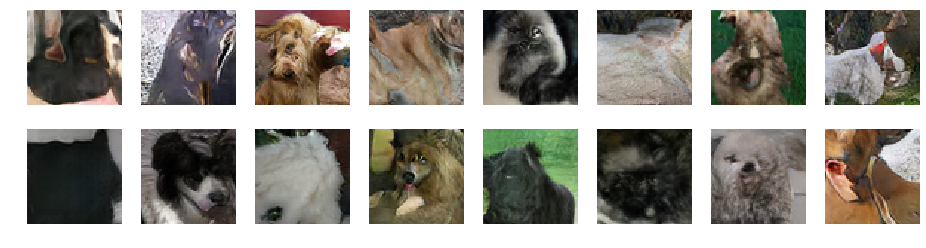

EPOCH 220 took 89.5 sec
Gen_loss mean= 13.514249 std= 1.4826387
Disc_loss mean= 2.0177224 std= 0.01078173
Learning rate = 2.57024221e-05


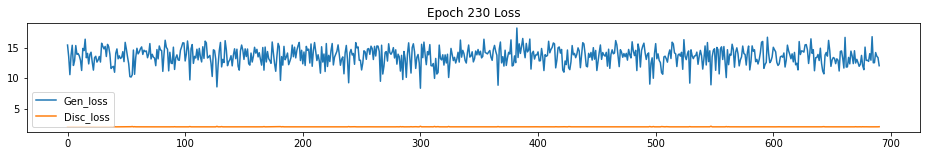

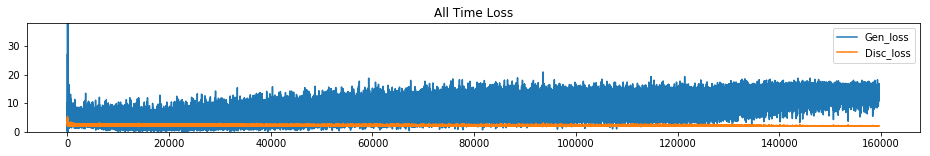

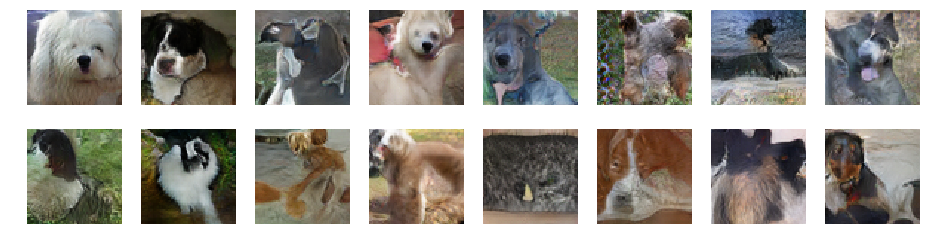

EPOCH 230 took 88.9 sec
Gen_loss mean= 13.622476 std= 1.4627357
Disc_loss mean= 2.0164535 std= 0.010121689
Learning rate = 1.53889887e-05


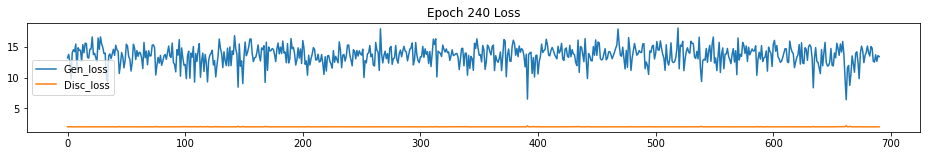

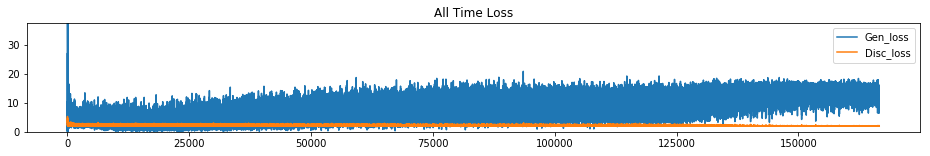

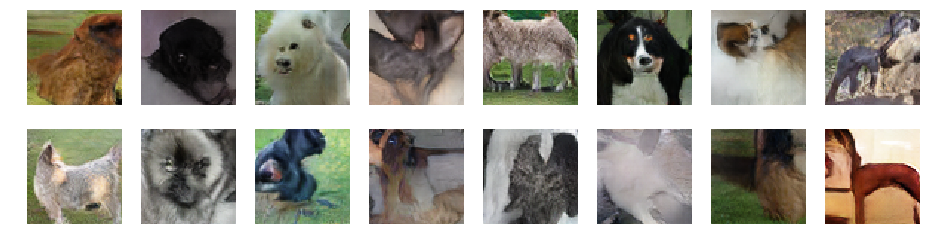

EPOCH 240 took 89.1 sec
Gen_loss mean= 13.60914 std= 1.5598352
Disc_loss mean= 2.0163877 std= 0.013061163
Learning rate = 9.21395531e-06


In [9]:
EPOCHS = 250
num_examples = 16

@ tf.function
def train_step(images,generator,discriminator,generator_optimizer,discriminator_optimizer):
        
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True,label_smoothing=0.4)
    bce2 = tf.keras.losses.BinaryCrossentropy(from_logits=False,label_smoothing=0.4)
    noise = tf.random.normal((32,128)) # update noise_dim here
    labs = tf.cast(120*tf.random.uniform((32,)),tf.int32)
    
    # USE GRADIENT TAPE TO CALCULATE GRADIENTS
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:       
        generated_images = generator([noise,labs], training=True)
        real_cat, real_output = discriminator([images[0],images[1]], training=True)
        fake_cat, fake_output = discriminator([generated_images,labs], training=True)
    
        # GENERATOR LOSS 
        gen_loss = (tf.reduce_mean( (real_output - tf.reduce_mean(fake_output,0) + tf.ones_like(real_output))**2,0 )
        + tf.reduce_mean( (fake_output - tf.reduce_mean(real_output,0) - tf.ones_like(real_output))**2,0 ) )/2.
        
        # DISCRIMINATOR LOSS
        disc_loss = bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)           
        real_cat2 = tf.one_hot(tf.cast(images[1],tf.int32),121,dtype=tf.int32)
        fake_cat2 = tf.one_hot(120*tf.ones((32,),tf.int32),121,dtype=tf.int32)
        disc_loss += bce2(real_cat2,real_cat) + bce2(fake_cat2,fake_cat) 
        
    # BACK PROPAGATE ERROR
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
       
    return gen_loss, disc_loss

print('Training started. Displaying every '+str(DISPLAY_EVERY)+'th epoch.')
train(ds, EPOCHS)

# 6. Display Generated Dog Breeds
For each breed, we will ask our Generator to draw us 10 dog pictures of that breed by feeding into our Generator both 10 random seeds `Z` of length 100 and a breed number `C` from 0 to 119 inclusive. Because this CGAN isn't optimal yet, some breeds may only output 1 image repeatedly. This is called `Mode Collapse`. Below we won't display the breeds with mode collapse. For each breed below we display one row of real pictures above two row of fake pictures.

Display Random Dogs by Breed

Wire REAL DOGS on top. FAKE DOGS on bottom. (variety = 2.2 )


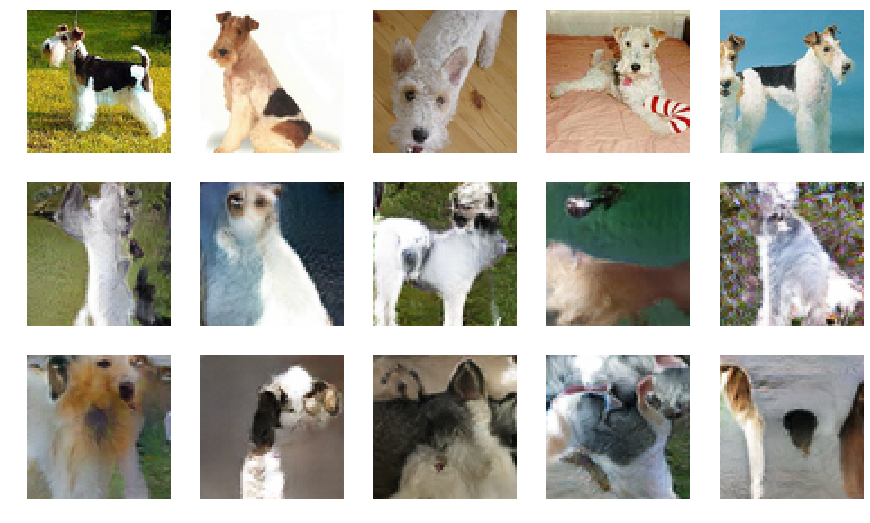

Lakeland_terrier REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.2 )


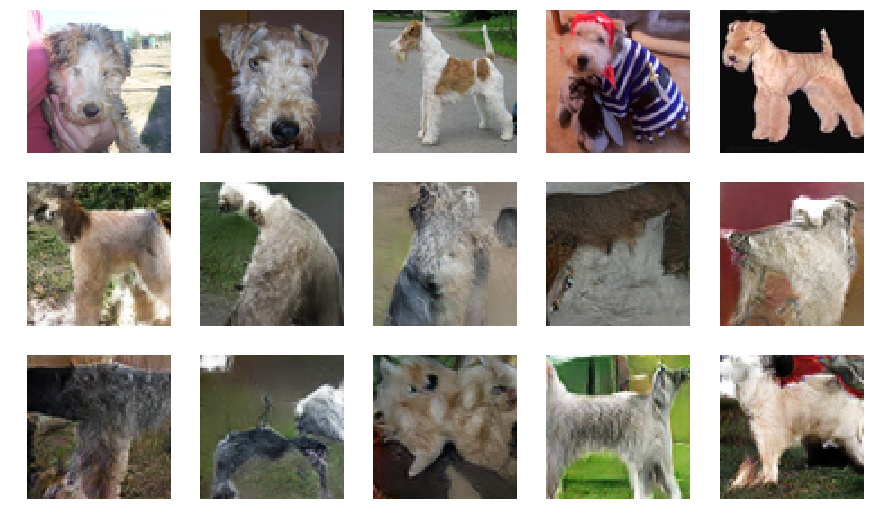

Weimaraner REAL DOGS on top. FAKE DOGS on bottom. (variety = 2.0 )


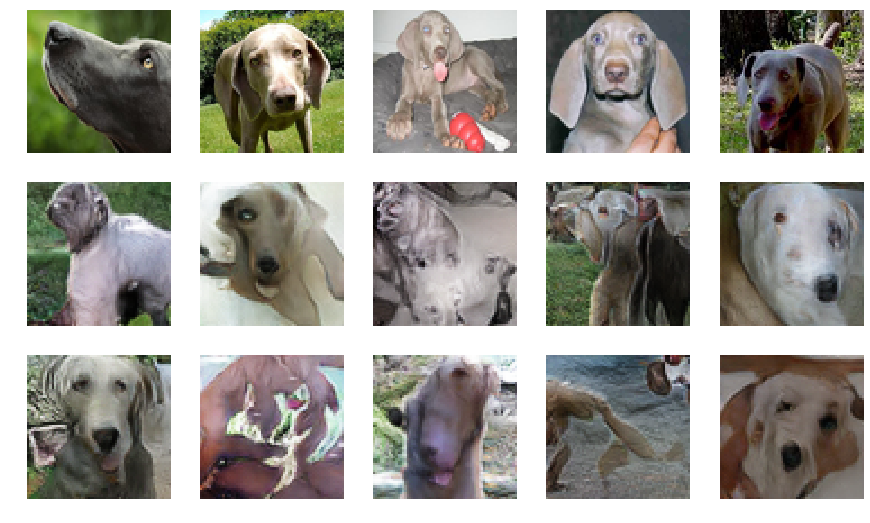

Toy_terrier REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.8 )


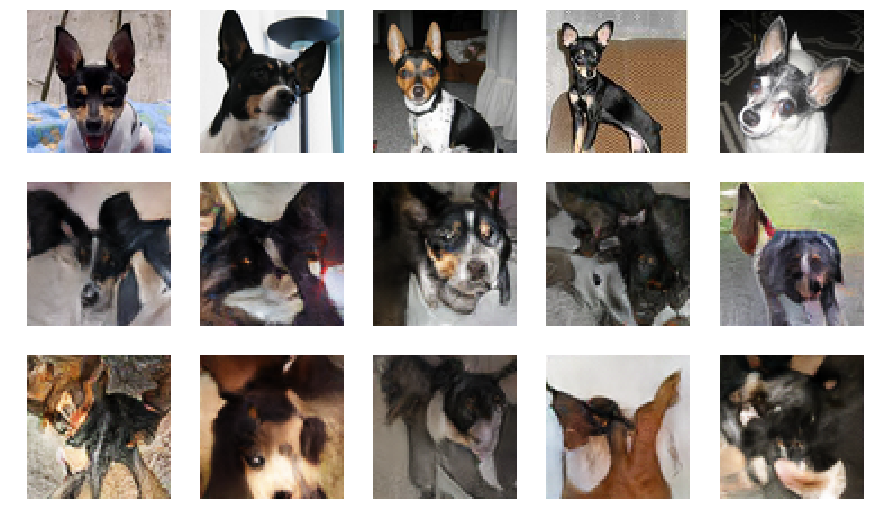

Wire REAL DOGS on top. FAKE DOGS on bottom. (variety = 2.1 )


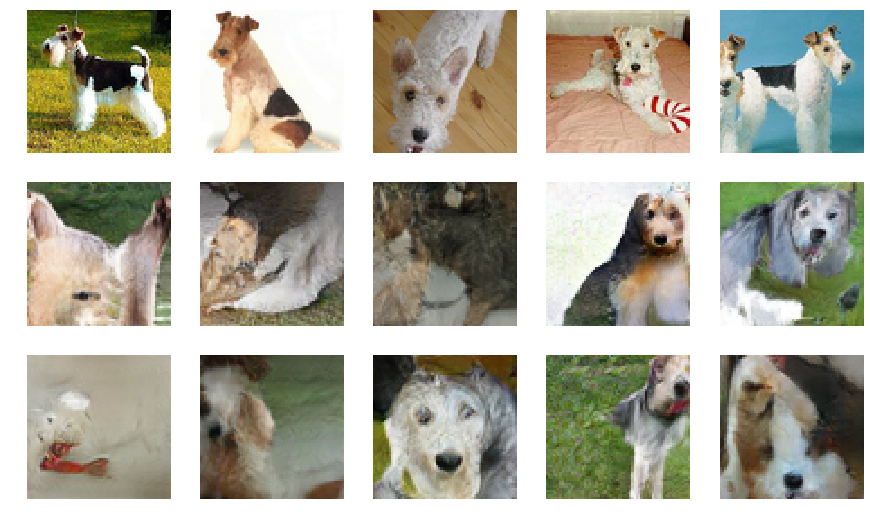

Sealyham_terrier REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.4 )


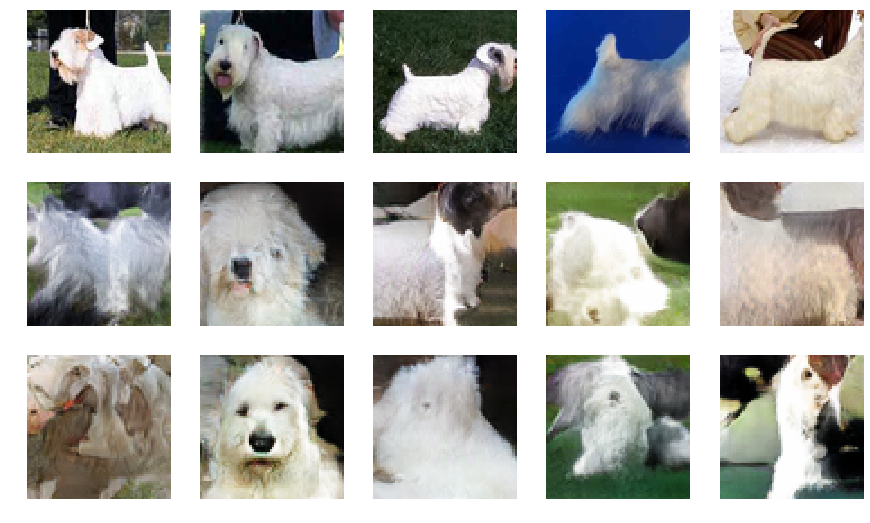

Border_collie REAL DOGS on top. FAKE DOGS on bottom. (variety = 2.0 )


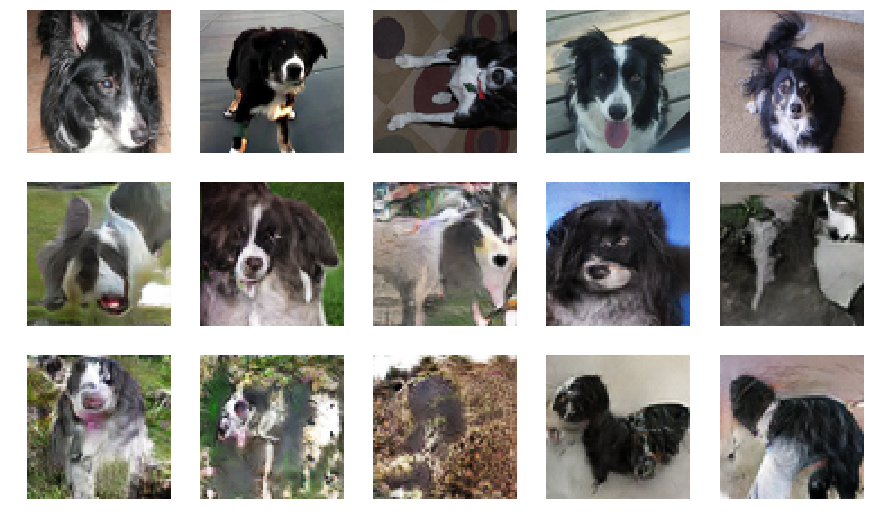

Boxer had mode collapse. No display. (variety = 0.8 )
Dhole REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.2 )


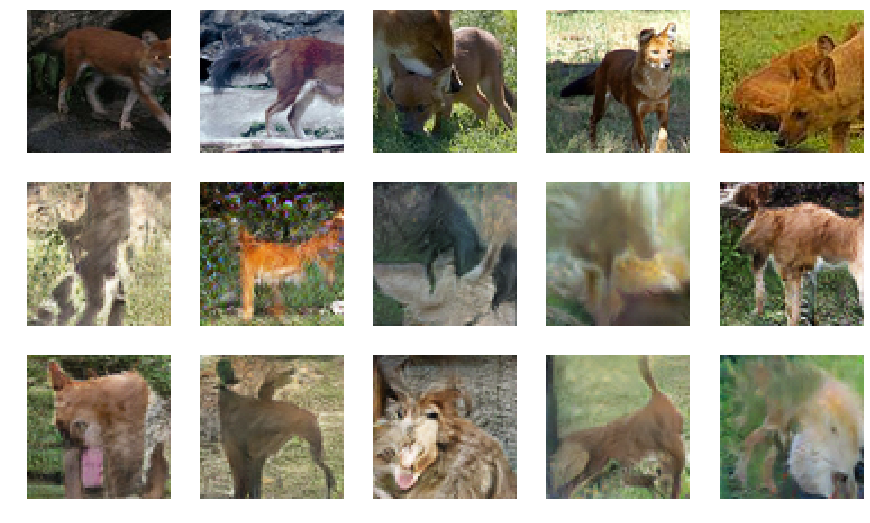

Shetland_sheepdog REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.3 )


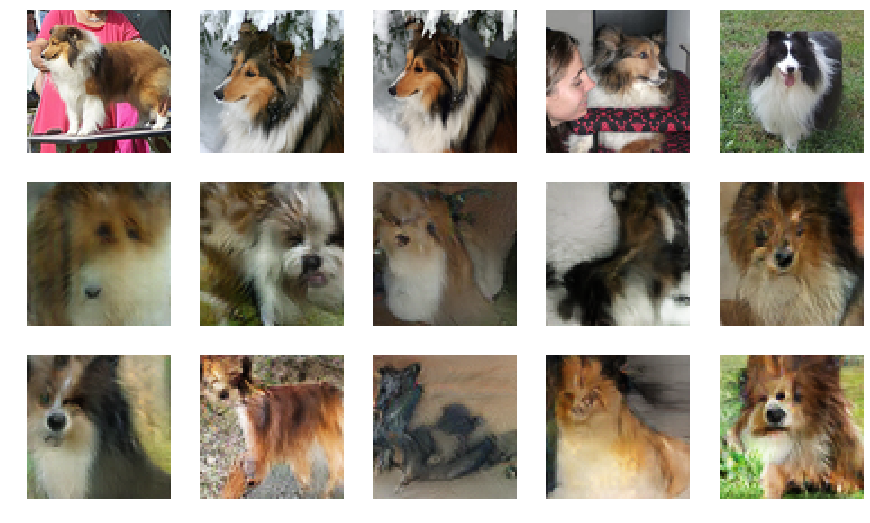

Cardigan REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.2 )


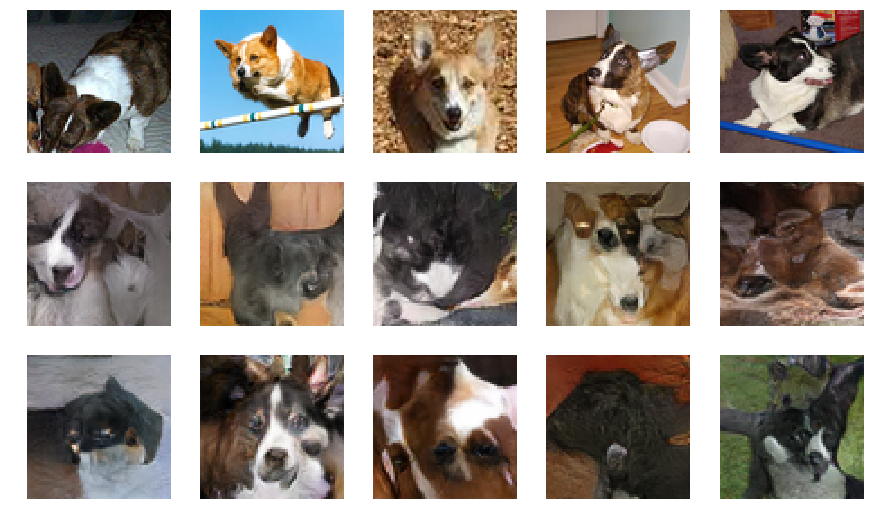

Ibizan_hound REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.5 )


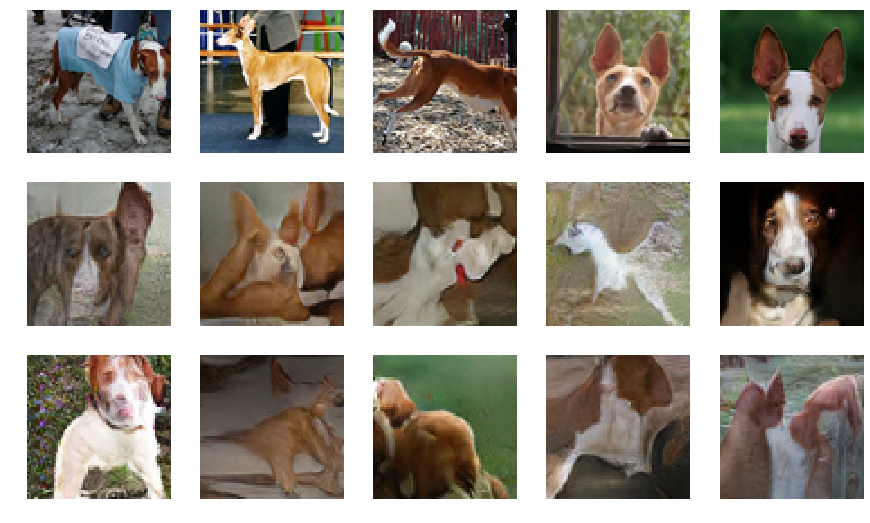

Whippet REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.2 )


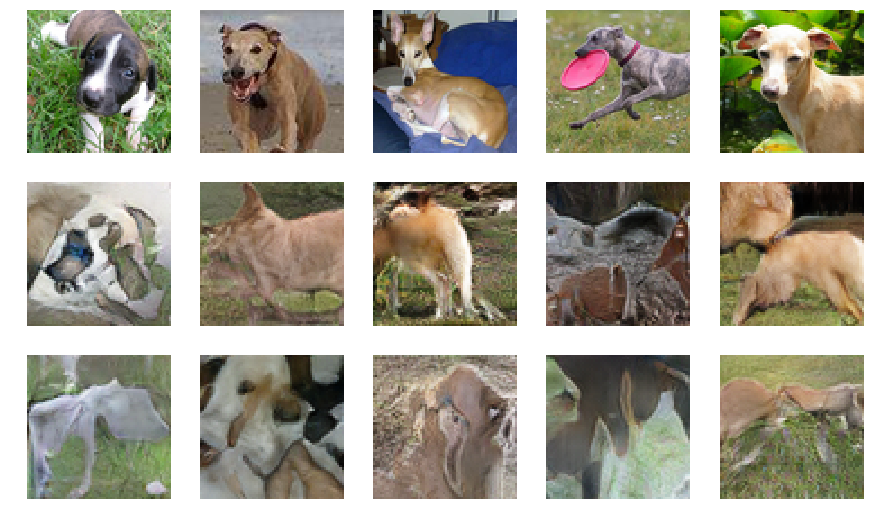

Norfolk_terrier had mode collapse. No display. (variety = 0.8 )
Norfolk_terrier REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.2 )


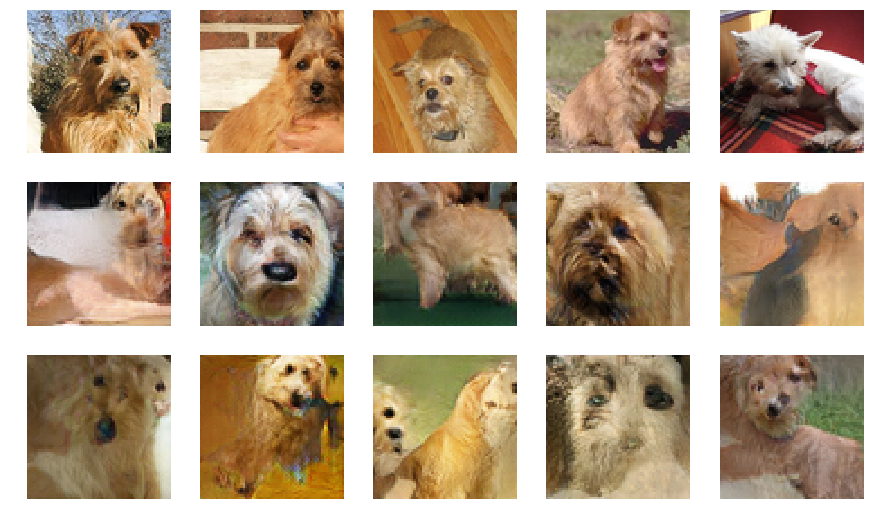

Vizsla had mode collapse. No display. (variety = 0.8 )
Wire REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.3 )


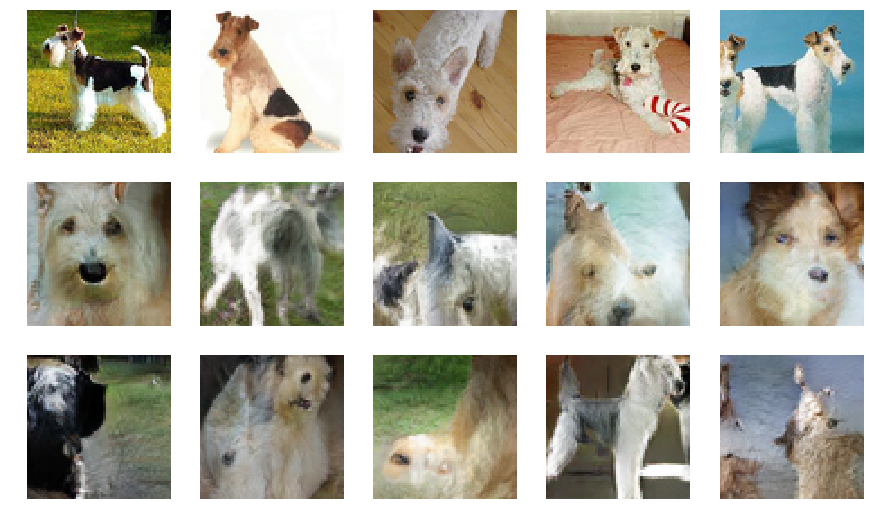

Brittany_spaniel REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.4 )


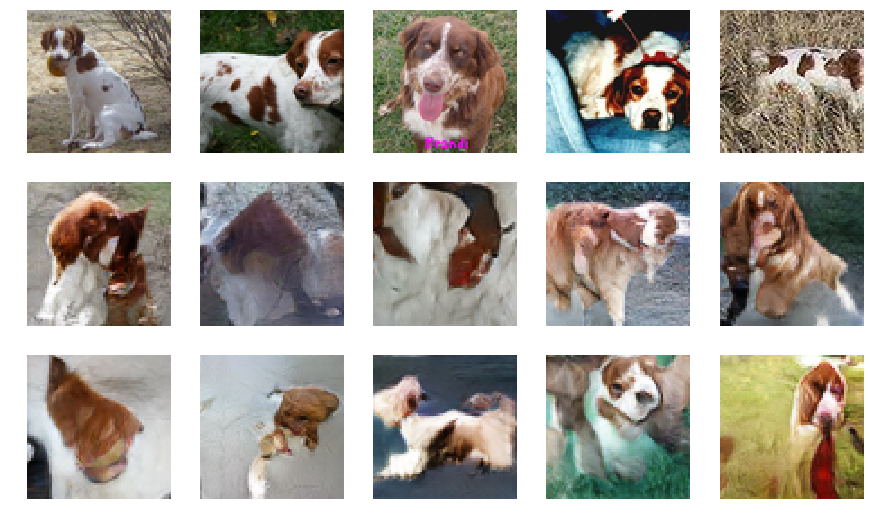

Keeshond REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.0 )


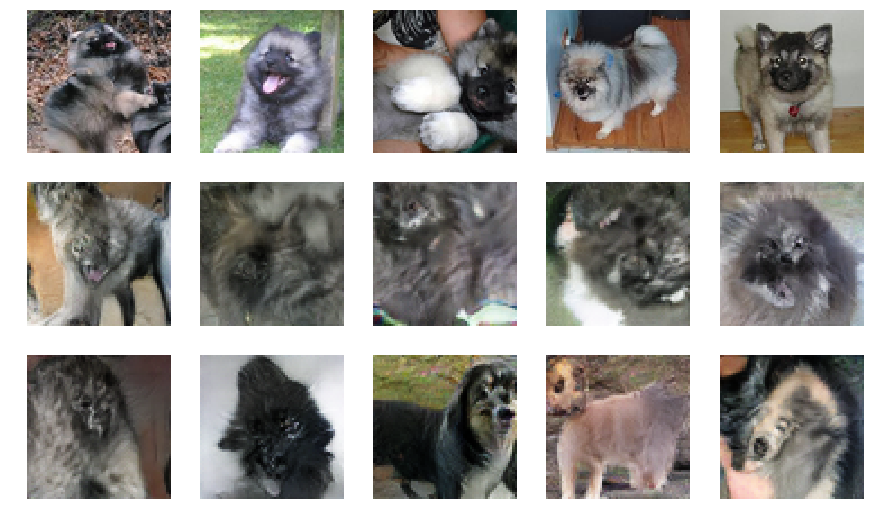

Shih REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.5 )


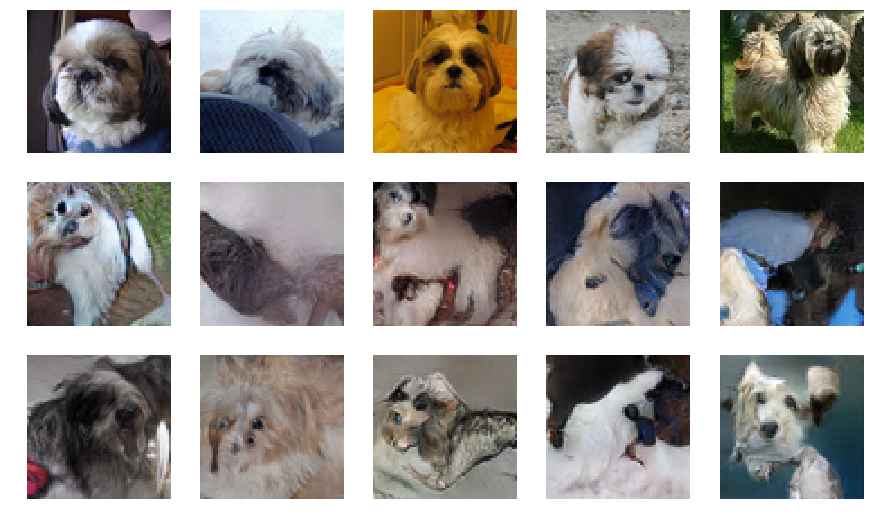

American_staffordshire_terrier REAL DOGS on top. FAKE DOGS on bottom. (variety = 2.3 )


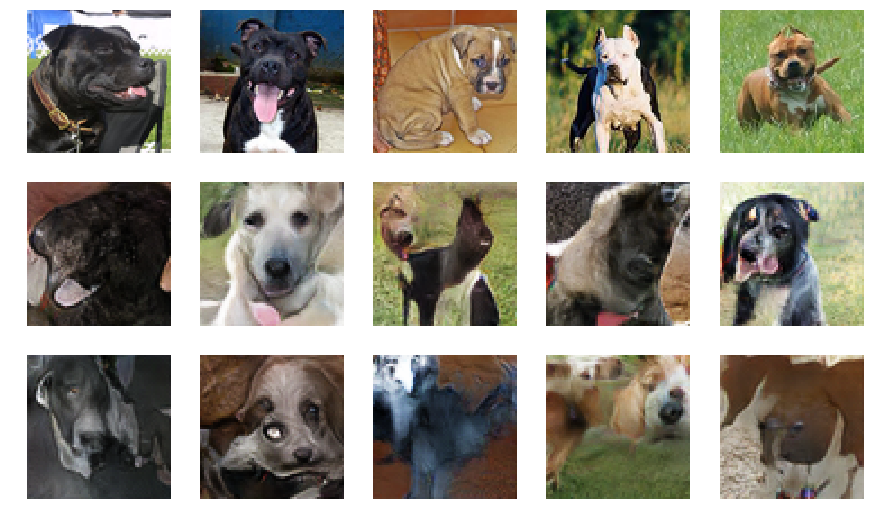

French_bulldog REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.5 )


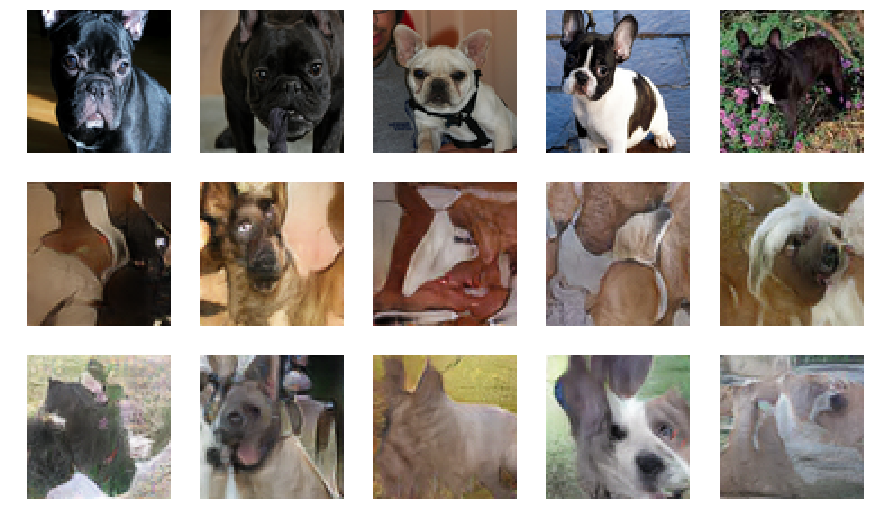

Brabancon_griffon REAL DOGS on top. FAKE DOGS on bottom. (variety = 1.5 )


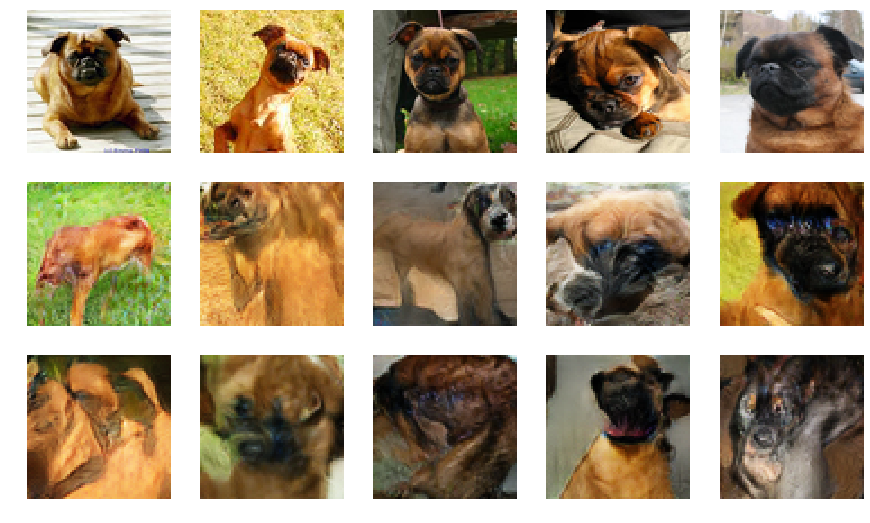

Gordon_setter REAL DOGS on top. FAKE DOGS on bottom. (variety = 2.1 )


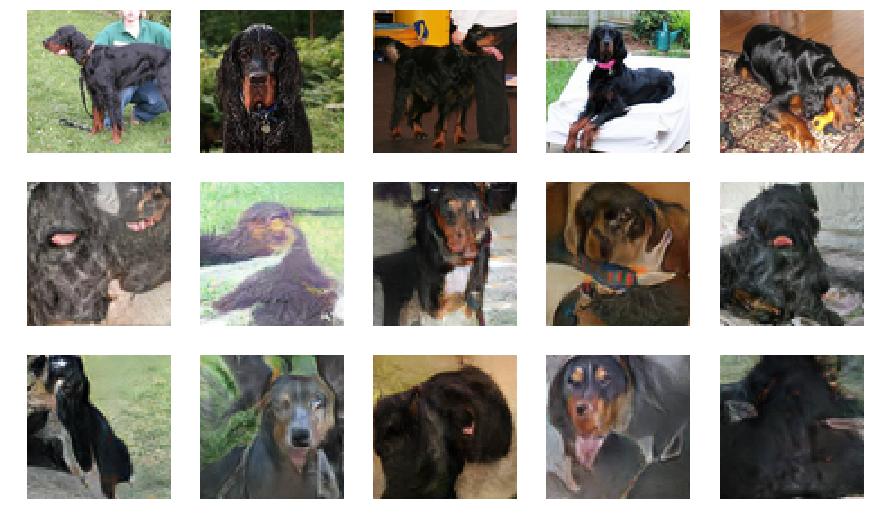

Norfolk_terrier had mode collapse. No display. (variety = 0.9 )


In [10]:
mse = tf.keras.losses.MeanSquaredError()

print('Display Random Dogs by Breed')
print()
for j in np.random.randint(0,120,25):
    # GENERATE DOGS
    seed = generate_latent_points(noise_dim, 10)
    labs = tf.cast( j*np.ones((10,1)), tf.int8)
    predictions = generator([seed,labs], training=False); d = 0   
    # GET BREED NAME    
    br = np.argwhere( namesIn==j ).flatten()
    bd = le.inverse_transform(np.array([j]))[0].capitalize()
    # CALCULATE VARIETY
    for k in range(4): d += mse(predictions[k,:,:,:],predictions[k+1,:,:,:]) 
    d = np.round( np.array(d),1 )
    if d<1.0: 
        print(bd,'had mode collapse. No display. (variety =',d,')')
        continue
    # DISPLAY DOGS
    print(bd,'REAL DOGS on top. FAKE DOGS on bottom. (variety =',d,')')
    plt.figure(figsize=(15,9))
    for i in range(5):
        plt.subplot(3,5,i+1)
        plt.imshow( (imagesIn[br[i],:,:,:]+1.)/2. )
        plt.axis('off')
    for i in range(10):
        plt.subplot(3,5,i+6)
        plt.imshow( (predictions[i,:,:,:]+1.)/2. )
        plt.axis('off')
    plt.show()